In [18]:
# Welcome to your new notebook
# Type here in the cell editor to add code!
# Welcome to your new notebook
# Type here in the cell editor to add code!
# Welcome to your new notebook
# Type here in the cell editor to add code!
df_news = spark.sql(""" select Account_Number,Ordered_Date, Item_Number,
Quantity_Ordered,
Product_Segment_Extnl_Cap_Disp,
Invoiced_Date,
Item_Description,
Major_Description,
Customer_Class_Code,
Resolved_Price_USD
from KPMG_Bronze.dbo.CONMED_SALES_UPDATED""")
display(df_news)


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 20, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 2f54fb1e-b255-499b-9e88-5167e2e302d0)

In [19]:
from pyspark.sql.functions import col, sum, count, max, datediff, lit
from pyspark.sql import functions as F

# Convert date columns to date format (if not already)
df_news = df_news.withColumn("Ordered_Date", col("Ordered_Date").cast("date"))
df_news = df_news.withColumn("Invoiced_Date", col("Invoiced_Date").cast("date"))

# Filter data for Q1 2020
df_q1_2020 = df_news.filter((col("Ordered_Date") >= "2021-01-01") & (col("Ordered_Date") <= "2021-03-31"))

# Calculate the latest transaction date in Q1 2020
max_date = df_q1_2020.agg(max("Ordered_Date")).collect()[0][0]

# RFM Calculation
rfm_df = df_q1_2020.groupBy("Account_Number").agg(
    datediff(lit(max_date), max("Ordered_Date")).alias("Recency"),  # Days since last purchase
    count("Quantity_Ordered").alias("Frequency"),  # Number of transactions
    sum("Resolved_Price_USD").alias("Monetary")  # Total spending
)

# Join RFM values back to the original DataFrame
df_final = df_q1_2020.join(rfm_df, on="Account_Number", how="left")

# Display the final DataFrame with all columns and RFM values
display(df_final)


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 21, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 6e70d38d-7c3e-4b95-ad95-12f5cc5f2196)

In [20]:
from pyspark.sql.functions import ntile
from pyspark.sql.window import Window


# Rank customers into 5 bins (1 = worst, 5 = best)
df_final = df_final.withColumn("R_Score", ntile(5).over(Window.orderBy("Recency")))
df_final = df_final.withColumn("F_Score", ntile(5).over(Window.orderBy(col("Frequency").desc())))
df_final = df_final.withColumn("M_Score", ntile(5).over(Window.orderBy(col("Monetary").desc())))

# Create RFM Score as a string
df_final = df_final.withColumn("RFM_Score", col("R_Score") + col("F_Score") + col("M_Score"))

# Show results
display(df_final)

StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 22, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 2bc310ae-a073-4490-be0b-89058eee12ae)

In [21]:
from pyspark.sql.functions import when

df_final = df_final.withColumn("Segment",
    when(col("RFM_Score") >= 13, "VIP Customer")
    .when((col("RFM_Score") >= 10) & (col("RFM_Score") < 13), "Loyal Customer")
    .when((col("RFM_Score") >= 6) & (col("RFM_Score") < 10), "At-Risk Customer")
    .otherwise("Lost Customer")
)

display(df_final)

StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 23, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 62cfc824-f75d-4525-b5bb-87e94253e33e)

In [22]:
import pandas as pd
import plotly.express as px

# Convert PySpark DataFrame to Pandas
rfm_pandas = df_final.select("Segment").toPandas()

# Count the number of customers in each segment
rfm_counts = rfm_pandas["Segment"].value_counts().reset_index()
rfm_counts.columns = ["Segment", "Count"]

# Plot the chart
fig = px.bar(
    rfm_counts,
    x="Segment",
    y="Count",
    color="Segment",
    title="Customer Segmentation Distribution",
    text_auto=True
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 24, Finished, Available, Finished)

In [23]:
import plotly.express as px

# Convert PySpark DataFrame to Pandas
rfm_pandas = df_final.select("Recency", "Frequency", "Monetary", "Segment").toPandas()

# Plot scatter plot
fig = px.scatter(
    rfm_pandas,
    x="Recency",  # More recent purchases should be to the left
    y="Monetary",  # Higher spenders at the top
    size="Frequency",  # More purchases = Bigger bubble
    color="Segment",  # Color by customer segment
    title="RFM Customer Segmentation Scatter Plot",
    hover_data=["Recency", "Frequency", "Monetary"]
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 25, Finished, Available, Finished)

In [24]:
from pyspark.sql.functions import col

# Convert RFM_Score to double if needed
df_final = df_final.withColumn("RFM_Score", col("RFM_Score").cast("double"))
df_final = df_final.withColumn("Recency", col("Recency").cast("double"))
df_final = df_final.withColumn("Frequency", col("Frequency").cast("double"))
df_final = df_final.withColumn("Monetary", col("Monetary").cast("double"))

df_final.printSchema()  # Check data types


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 26, Finished, Available, Finished)

root
 |-- Account_Number: string (nullable = true)
 |-- Ordered_Date: date (nullable = true)
 |-- Item_Number: string (nullable = true)
 |-- Quantity_Ordered: decimal(34,6) (nullable = true)
 |-- Product_Segment_Extnl_Cap_Disp: string (nullable = true)
 |-- Invoiced_Date: date (nullable = true)
 |-- Item_Description: string (nullable = true)
 |-- Major_Description: string (nullable = true)
 |-- Customer_Class_Code: string (nullable = true)
 |-- Resolved_Price_USD: decimal(34,6) (nullable = true)
 |-- Recency: double (nullable = true)
 |-- Frequency: double (nullable = true)
 |-- Monetary: double (nullable = true)
 |-- R_Score: integer (nullable = false)
 |-- F_Score: integer (nullable = false)
 |-- M_Score: integer (nullable = false)
 |-- RFM_Score: double (nullable = false)
 |-- Segment: string (nullable = false)



In [25]:
from pyspark.ml.feature import VectorAssembler

# Assemble numeric features into a single vector column
assembler = VectorAssembler(
    inputCols=["Recency", "Frequency", "Monetary"], 
    outputCol="features",
    handleInvalid="skip"  # Drop rows with invalid data
)

rfm_df_transformed = assembler.transform(df_final)
rfm_df_transformed.select("features").show(5, truncate=False)  # Check transformation
from pyspark.ml.feature import VectorAssembler

# Assemble numeric features into a single vector column
assembler = VectorAssembler(
    inputCols=["Recency", "Frequency", "Monetary"], 
    outputCol="features",
    handleInvalid="skip"  # Drop rows with invalid data
)

rfm_df_transformed = assembler.transform(df_final)
rfm_df_transformed.select("features").show(5, truncate=False)  # Check transformation


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 27, Finished, Available, Finished)

+--------------------+
|features            |
+--------------------+
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
+--------------------+
only showing top 5 rows

+--------------------+
|features            |
+--------------------+
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
|[12.0,13.0,21490.13]|
+--------------------+
only showing top 5 rows



In [26]:
from pyspark.ml.feature import StandardScaler

scaler = StandardScaler(inputCol="features", outputCol="scaled_features", withStd=True, withMean=True)
scaler_model = scaler.fit(rfm_df_transformed)
rfm_scaled = scaler_model.transform(rfm_df_transformed)


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 28, Finished, Available, Finished)

In [27]:
from pyspark.ml.clustering import KMeans

# Train K-Means model
kmeans = KMeans(featuresCol="scaled_features", k=5, seed=42)
model = kmeans.fit(rfm_scaled)

# Assign clusters to customers
rfm_clusters = model.transform(rfm_scaled)

# Show results
rfm_clusters.select("Recency", "Frequency", "Monetary", "prediction").show(10)


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 29, Finished, Available, Finished)

+-------+---------+--------+----------+
|Recency|Frequency|Monetary|prediction|
+-------+---------+--------+----------+
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
|   12.0|     13.0|21490.13|         0|
+-------+---------+--------+----------+
only showing top 10 rows



In [28]:
from pyspark.sql.functions import col

rfm_clusters = rfm_clusters.withColumn("KMeans_Segment",
     when(col("prediction") == 0,   "x1") 
    .when(col("prediction") == 1,   "x2") 
    .when(col("prediction") == 2,   "x3")
    .when(col("prediction") == 3,   "x4")
    .when(col("prediction") == 4,   "x5") 
)

rfm_clusters.select("Account_Number", "Recency", "Frequency", "Monetary", "prediction", "KMeans_Segment").show(10)


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 30, Finished, Available, Finished)

+--------------+-------+---------+--------+----------+--------------+
|Account_Number|Recency|Frequency|Monetary|prediction|KMeans_Segment|
+--------------+-------+---------+--------+----------+--------------+
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
|      05007001|   12.0|     13.0|21490.13|         0|            x1|
+--------------+-------+---------+--------+----------+--------------+
only showing top 10 

In [29]:
import plotly.express as px

# Convert to Pandas
rfm_pandas = rfm_clusters.select("Account_Number", "Recency", "Frequency", "Monetary", "prediction", "KMeans_Segment").toPandas()

# Scatter plot
fig = px.scatter(
    rfm_pandas,
    x="Recency",
    y="Monetary",
    color=rfm_pandas["KMeans_Segment"].astype(str),  # Convert cluster numbers to string for color distinction
    title="K-Means Customer Segmentation Scatter Plot",
    hover_data=["Account_Number", "Recency", "Frequency", "Monetary", "KMeans_Segment"]  # Include segment labels
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 31, Finished, Available, Finished)

In [30]:
#import plotly.express as px
import plotly.express as px

# Define a fixed color mapping for clusters
cluster_color_map = {
    "x1": "#1f77b4",  # Blue
    "x2": "#ff7f0e",  # Orange
    "x3": "#2ca02c",  # Green
    "x4": "#d62728",  # Red
    "x5": "#9467bd"   # Purple
}

# Convert to Pandas
rfm_pandas = rfm_clusters.select("Account_Number", "Recency", "Frequency", "Monetary", "prediction", "KMeans_Segment").toPandas()

# Convert Cluster to string to ensure discrete colors
rfm_pandas["prediction"] = rfm_pandas["prediction"].astype(str)

# 3D Scatter plot
fig = px.scatter_3d(
    rfm_pandas,
    x="Frequency",
    y="Monetary",
    z="Recency",
    color=rfm_pandas["KMeans_Segment"].astype(str),  # Convert cluster numbers to string for color distinction
    title="3D K-Means Customer Segmentation",
    hover_data=["Account_Number", "Recency", "Frequency", "Monetary"],
    color_discrete_map=cluster_color_map  # Ensures distinct colors
)

# Set figure size
fig.update_layout(
    width=1200,
    height=800
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 32, Finished, Available, Finished)

In [31]:
import plotly.express as px
from pyspark.sql import functions as F

# Aggregate RFM metrics by year
rfm_trend = rfm_clusters.groupBy("Ordered_Date").agg(
    F.avg("Recency").alias("Avg_Recency"),
    F.avg("Frequency").alias("Avg_Frequency"),
    F.avg("Monetary").alias("Avg_Monetary")
).toPandas()

# Convert Year to string for better visualization
rfm_trend["Ordered_Date"] = rfm_trend["Ordered_Date"].astype(str)

# Plot RFM Trends
fig = px.line(
    rfm_trend, x="Ordered_Date", y=["Avg_Recency", "Avg_Frequency", "Avg_Monetary"], 
    title="Yearly Trends of RFM Metrics (Q1: 2020-2025)",
    markers=True
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 33, Finished, Available, Finished)

StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 34, Finished, Available, Finished)

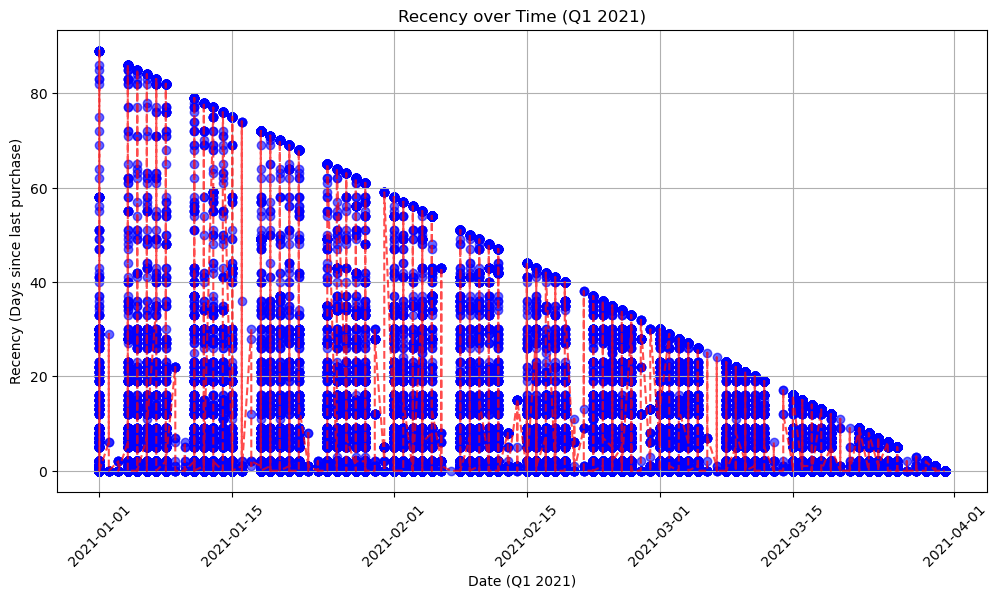

In [32]:
import matplotlib.pyplot as plt
import pandas as pd

# Convert Spark DataFrame to Pandas for plotting
df_pandas = df_final.select("Ordered_Date", "Recency").toPandas()

# Sort data by date
df_pandas = df_pandas.sort_values(by="Ordered_Date")

# Plot
plt.figure(figsize=(12, 6))
plt.scatter(df_pandas["Ordered_Date"], df_pandas["Recency"], color='blue', alpha=0.6)
plt.plot(df_pandas["Ordered_Date"], df_pandas["Recency"], color='red', linestyle='dashed', alpha=0.7)

# Labels & Title
plt.xlabel("Date (Q1 2021)")
plt.ylabel("Recency (Days since last purchase)")
plt.title("Recency over Time (Q1 2021)")
plt.xticks(rotation=45)  # Rotate dates for better visibility
plt.grid()

# Show the plot
plt.show()


In [33]:
# Count customers in each cluster per year
cluster_trend = rfm_clusters.groupBy("Ordered_Date", "KMeans_Segment").count().toPandas()

# Convert columns for visualization
cluster_trend["Ordered_Date"] = cluster_trend["Ordered_Date"].astype(str)
cluster_trend["KMeans_Segment"] = cluster_trend["KMeans_Segment"].astype(str)

# Plot Cluster Trends
fig = px.bar(
    cluster_trend, x="Ordered_Date", y="count", color="KMeans_Segment",
    title="Customer Segments Over Time (Q1: 2020-2025)",
    barmode="stack",
    color_discrete_sequence=px.colors.qualitative.Set1
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 35, Finished, Available, Finished)

In [34]:
display(rfm_clusters)

StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 36, Finished, Available, Finished)

SynapseWidget(Synapse.DataFrame, 4f22b73d-2604-4947-b6ef-f74a26f1dcaf)

In [35]:
import plotly.express as px

# Define a fixed color mapping for clusters
cluster_color_map = {
    "x1": "#1f77b4",  # Blue
    "x2": "#ff7f0e",  # Orange
    "x3": "#2ca02c",  # Green
    "x4": "#d62728",  # Red
    "x5": "#9467bd"   # Purple
}

# Convert Spark DataFrame to Pandas
rfm_pandas = rfm_clusters.toPandas()

# Ensure KMeans_Segment column is a string
rfm_pandas["KMeans_Segment"] = rfm_pandas["KMeans_Segment"].astype(str)

# Compute count of transactions per date per segment
df_count = rfm_pandas.groupby(["Ordered_Date", "KMeans_Segment"]).size().reset_index(name="count")

# Plot using fixed colors
fig = px.bar(
    df_count, 
    x="Ordered_Date", 
    y="count",  # Now the correct column
    color="KMeans_Segment", 
    title="Customer Segment Trends Over Time",
    barmode="stack",
    color_discrete_map=cluster_color_map  # Apply fixed colors
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 37, Finished, Available, Finished)

In [36]:
import plotly.express as px

# Define a fixed color mapping for clusters
cluster_color_map = {
    "x1": "#1f77b4",  # Blue
    "x2": "#ff7f0e",  # Orange
    "x3": "#2ca02c",  # Green
    "x4": "#d62728",  # Red
    "x5": "#9467bd"   # Purple
}

# Convert Spark DataFrame to Pandas
rfm_pandas = rfm_clusters.toPandas()

# Ensure KMeans_Segment column is a string
rfm_pandas["KMeans_Segment"] = rfm_pandas["KMeans_Segment"].astype(str)

# Compute total revenue per date per segment
df_revenue = rfm_pandas.groupby(["Ordered_Date", "KMeans_Segment"])["Resolved_Price_USD"].sum().reset_index(name="Revenue")

# Plot using fixed colors
fig = px.bar(
    df_revenue, 
    x="Ordered_Date", 
    y="Revenue",  # Changed from "count" to "Revenue"
    color="KMeans_Segment", 
    title="Customer Segment Revenue Trends Over Time",
    barmode="stack",
    color_discrete_map=cluster_color_map  # Apply fixed colors
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 38, Finished, Available, Finished)

In [37]:
# Convert Spark DataFrame to Pandas
rfm_pandas = rfm_clusters.toPandas()

# Ensure KMeans_Segment column is a string
rfm_pandas["KMeans_Segment"] = rfm_pandas["KMeans_Segment"].astype(str)

# Compute total revenue per cluster for the quarter
df_quarterly_revenue = rfm_pandas.groupby("KMeans_Segment")["Resolved_Price_USD"].sum().reset_index(name="Total_Revenue")

# Compute overall total revenue
total_revenue = df_quarterly_revenue["Total_Revenue"].sum()

# Compute percentage contribution of each segment
df_quarterly_revenue["Percentage"] = (df_quarterly_revenue["Total_Revenue"] / total_revenue) * 100

# Identify the dominant cluster
dominant_cluster = df_quarterly_revenue.loc[df_quarterly_revenue["Percentage"].idxmax()]

# Print the result
print("Quarterly Revenue Breakdown by Segment:")
print(df_quarterly_revenue)

print("\nDominant Segment for the Quarter:")
print(f"Segment: {dominant_cluster['KMeans_Segment']}, Revenue: {dominant_cluster['Total_Revenue']}, Share: {dominant_cluster['Percentage']:.2f}%")

# Visualization (Optional)
fig = px.pie(
    df_quarterly_revenue, 
    names="KMeans_Segment", 
    values="Total_Revenue", 
    title="Revenue Distribution by Customer Segment (Quarterly)",
    color="KMeans_Segment",
    color_discrete_map=cluster_color_map  
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 39, Finished, Available, Finished)

Quarterly Revenue Breakdown by Segment:
  KMeans_Segment    Total_Revenue                     Percentage
0             x1   9490818.349100  17.53453814183825466083060008
1             x2  27462511.740200  50.73771743032904081657340543
2             x3   1557280.658100  2.877117240326365942750068389
3             x4  11152385.563500  20.60432755561283726724527677
4             x5   4463427.050400  8.246299631893501312600649331

Dominant Segment for the Quarter:
Segment: x2, Revenue: 27462511.740200, Share: 50.74%


In [38]:
# Convert Spark DataFrame to Pandas
rfm_pandas = rfm_clusters.toPandas()

# Ensure KMeans_Segment column is a string
rfm_pandas["KMeans_Segment"] = rfm_pandas["KMeans_Segment"].astype(str)

# Count unique customers per segment
df_customer_count = rfm_pandas.groupby("KMeans_Segment")["Account_Number"].nunique().reset_index(name="Total_Customers")

# Compute overall total customers
total_customers = df_customer_count["Total_Customers"].sum()

# Compute percentage contribution of each segment
df_customer_count["Percentage"] = (df_customer_count["Total_Customers"] / total_customers) * 100

# Identify the dominant segment
dominant_cluster = df_customer_count.loc[df_customer_count["Percentage"].idxmax()]

# Print the result
print("Customer Count Breakdown by Segment:")
print(df_customer_count)

print("\nDominant Segment by Customer Count:")
print(f"Segment: {dominant_cluster['KMeans_Segment']}, Customers: {dominant_cluster['Total_Customers']}, Share: {dominant_cluster['Percentage']:.2f}%")

# Visualization (Optional)
fig = px.pie(
    df_customer_count, 
    names="KMeans_Segment", 
    values="Total_Customers", 
    title="Customer Distribution by Segment (Quarterly)",
    color="KMeans_Segment",
    color_discrete_map=cluster_color_map  
)

fig.show()


StatementMeta(, 5855a33e-c557-410b-bccf-b9c4209677b7, 40, Finished, Available, Finished)

Customer Count Breakdown by Segment:
  KMeans_Segment  Total_Customers  Percentage
0             x1             1568   34.545054
1             x2             1934   42.608504
2             x3                6    0.132188
3             x4               14    0.308438
4             x5             1017   22.405816

Dominant Segment by Customer Count:
Segment: x2, Customers: 1934, Share: 42.61%
